<a href="https://colab.research.google.com/github/cerkut/1-intro-to-ML/blob/main/08-Workshop/ML_for_Audio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SPIS Workshop
## Audio Processing from a Machine Learning Perspective

Welcome to the main notebook of the workshop "*Audio Processing from a Machine Learning Perspective*", created for the "*Signal Processing for Interactive Systems*" course at Aalborg University Copenhagen. During this workshop we will cover how machine learning principles can be applied to audio, specifically for audio-effects and audio-processing. Some of you may be familiar with "neural networks", which are models that operate on an input using different layers of functions, additions and multiplications in order to predict a specific target. This workshop is <ins>NOT</ins> a walkthrough of neural networks. Rather, we will look at machine-learning principles from a signal-based approach, more specifically called "*Differential Digital Signal Processing*" (DDSP).

This notebook will cover the following:

- Introduction: What is DDSP and how can we use it?
- PyTorch and differentiability: A quick recap
- Toy problem: A differentiable gain control
- Other use-cases: Filter design, synthesis etc.

Much of this notebook is based on the workshop "*Introduction to DDSP for Audio Synthesis*" by Ben Hayes, Jordie Shier, Chin-Yun Yu, David Südholt, Rodrigo Diaz (https://intro2ddsp.github.io/intro.html#).

I additionally refer you to the following work for more information:

- DDSP, Differentiable Digital Signal Processing: https://magenta.tensorflow.org/ddsp (2019)
- Kuznetsov et. al: Differentiable IIR Filters for Machine Learning Applications (2020)
- Hayes et. al: A Review of Differentiable Digital Signal Processing for Music & Speech Synthesis (2023)
- Steinmetz et. al: Style Transfer of Audio Effects with Differentiable Signal Processing https://csteinmetz1.github.io/DeepAFx-ST/ (2022)
- Bargum et. al: Differentiable Allpass Filters for Phase Response Estimation and Automatic Signal Alignment (2023)



### Import packages

In [17]:
try:
  import google.colab
  IN_COLAB = True
  !wget https://raw.githubusercontent.com/SMC-AAU-CPH/SPIS/main/08-Workshop/utils.py
  !mkdir -p sound-files
  !wget https://raw.githubusercontent.com/SMC-AAU-CPH/SPIS/main/08-Workshop/sound-files/guitar.wav -P sound-files
except:
  IN_COLAB = False

--2024-04-08 11:10:28--  https://raw.githubusercontent.com/SMC-AAU-CPH/SPIS/main/08-Workshop/utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3628 (3.5K) [text/plain]
Saving to: ‘utils.py.1’

utils.py.1          100%[===================>]   3.54K  --.-KB/s    in 0s      

2024-04-08 11:10:28 (31.2 MB/s) - ‘utils.py.1’ saved [3628/3628]

--2024-04-08 11:10:28--  https://raw.githubusercontent.com/SMC-AAU-CPH/SPIS/main/08-Workshop/sound-files/guitar.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1583068 (1.5M) [audio/wav

In [18]:
from utils import plot_graph, get_sine, plot_tf, DIIRDataSet, DIIR_WRAPPER
import IPython.display as ipd
import torch
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib import pyplot as plt
from torch.nn import Module, Parameter
from torch import FloatTensor
from numpy.random import uniform
from torch.utils.data import DataLoader
import json
import librosa

## Introduction: Differential Digital Signal Processing (DDSP)

From a mathematical perspective a *differentiable* function is a function whose derivative exists at all points in its domain i.e. that we can take the derivate of function *f(x)* no matter what value *x* takes.

**I like to think of <ins>differentiable</ins> as something that is "updatable"**.

In a signal processing manner, this means that we can take a signal processor (being a function), and approximate its behaviour. We to this by implementing its function and automatically updating it (can only be done if the signal processing function itself is differentiable). With this in mind, we can implement a signal processor, or a chain of different signal processors, and automatically update its internal parameters using an automatic differentiation framework such as TensorFlow, PyTorch, or Jax (which does all the troublesome differentiation-work for you).

Lets look at an example:

### A simple **Linear Gain** Effect

A linear gain effect is a really simple and good example of how differentiable signal processing works, as it presents a differentiable system (we can take the derivative of f(x)) with an obvious parameter (the gain factor *g*). Normally, it would be very easy for us as developers just to change the value *g* to find the desired gain.

But what if the system was part of a larger sub-system? In that case it would not be as easy.
Or what if we were to create a specific frequency response using a filter with coefficients a1, a2, a3, b1, b2, b3? Then it would also be very easy to tune the coefficients by hand.

In the case of the linear gain effect, we can finde the gain value *g* using differentiability.

We need:

1. An input, could be anything from a sine wave to a complex instrument signal
2. An output, the same as the input signal but affected by the system we want to approximate (lets say at half the amplitude value of the input)
3. The system we want to approximate, implemented for differentiation (using <ins>nn.Module</ins> in PyTorch)
4. A loss function that can compare how far our target is from our prediction
5. Gradients telling us how far we the given parameters are from minimizing the loss function

Following the pipeline below, we can then recursively keep updating gain parameter *g* until the output of the gain-system matches that of the target.


<div>
<img src="https://github.com/SMC-AAU-CPH/SPIS/blob/main/08-Workshop/ddsp.png?raw=1" width="1000"/>
</div>

# PyTorch and Differentiability

To implement above system we can use PyTorch. PyTorch provides many utilities around neural networks and deep learning, but at its very core it consists of two main features: GPU-accelerated linear algebra operations, and automatic differentiation.

Let’s quickly recap the basics of PyTorch.

## Tensors

Tensors are the basic data structure in PyTorch. They are similar to numpy arrays, but offer support for the two main features mentioned above.

In [19]:
# Create a scalar (0D tensor)
scalar = torch.tensor(42, dtype=torch.float32) # explicitly enforce float type
print("a =", scalar)

# Create a vector (1D tensor)
vector = torch.tensor([1., 2., 3.])
print("v =", vector)

# Create a matrix (2D tensor)
matrix = torch.tensor([[1., 2., 3.], [4., 5., 6.]])
print("M =", matrix)

a = tensor(42.)
v = tensor([1., 2., 3.])
M = tensor([[1., 2., 3.],
        [4., 5., 6.]])


Basic arithmetic operations are applied element-wise:

In [20]:
print("v + v =", vector + vector) #addition of two vectors
print("v * v =", vector * vector) #multiplication of two vectors (element-wise)
print("M * v =", matrix * vector) #broadcasting (expanding dimensions automatically)

print("M x v", torch.matmul(matrix, vector)) #matrix multiplication/dot product ((2x3) * (3x1) = (2x1))
print("M @ v =", matrix @ vector) #matrix multiplication/dot product ((2x3) * (3x1) = (2x1))

print("v^2 =", vector ** 2)  #take the power of 2 element-wise
print("exp(v) =", torch.exp(vector)) #take the exponent element-wise
print("sin(v) =", torch.sin(vector)) #take the sine element-wise

v + v = tensor([2., 4., 6.])
v * v = tensor([1., 4., 9.])
M * v = tensor([[ 1.,  4.,  9.],
        [ 4., 10., 18.]])
M x v tensor([14., 32.])
M @ v = tensor([14., 32.])
v^2 = tensor([1., 4., 9.])
exp(v) = tensor([ 2.7183,  7.3891, 20.0855])
sin(v) = tensor([0.8415, 0.9093, 0.1411])


## Gradients and Auto-Differentiation

As in the linear gain example, we are interested in a value that minimize the difference between the system-output and the target (also called the loss or the error). In this case the loss is an objective function that we try to minimize. In order to do this we can use automatic differentiation: if we know the gradient of a function with respect to its inputs, we know that adjusting the inputs in the opposite direction of the gradient will decrease the value of the function. This is called gradient descent optimization.

To let PyTorch know that we want to compute the gradient with respect to a certain tensor, we need to set the requires_grad flag. Let’s take a look at what happens when we do this and perform operations on the tensor to calculate: y = g * x.

In [21]:
#We initalise the input at a random value
x = torch.tensor(0.1, requires_grad=True)

#We intialise g at a random value
g = torch.tensor(0.8, requires_grad=True)

#We define the function we want to optimise
y = g * x

#We see that every tensor now carries an attribute grad_fn that describes how to compute the gradient of the operation that it resulted from.
print("g:", g)
print("x:", x)
print("y:", y)

# In the backward pass, this graph is used to compute the gradient of the final output with respect to the initial inputs.
# The backward pass can be triggered by calling the backward() method on the final output.
y.backward()
print("dy/dx evaluated at g=0.8:", x.grad.numpy())

print("This makes sense as the derivative of our function g * x with respect to x equals to g")

g: tensor(0.8000, requires_grad=True)
x: tensor(0.1000, requires_grad=True)
y: tensor(0.0800, grad_fn=<MulBackward0>)
dy/dx evaluated at g=0.8: 0.8
This makes sense as the derivative of our function g * x with respect to x equals to g


Lets look at a more "complicated" example, with function: $z = sin((w + 1)^3)$.

We can either split the function into sub-computations - using the chain rule from calculus we can then calculate the gradient of the final output with respect to the input by decomposing it into a product of gradients from the sub-computations:

$\dfrac{dz}{dw} = \dfrac{dz}{dy} \cdot \dfrac{dy}{dx} \cdot \dfrac{dx}{dw}$

Or we can do it directly on the function.

In [22]:
#sub computations
w = torch.tensor(1., requires_grad=True)
x = w + 1
y = x ** 3
z = torch.sin(y)
z.backward()
print("dz/dw evaluated at w=1:", w.grad)

#directly
w = torch.tensor(1., requires_grad=True)
z = torch.sin(torch.pow((w+1),3))
z.backward()
print("dz/dw evaluated at w=1:", w.grad)

dz/dw evaluated at w=1: tensor(-1.7460)
dz/dw evaluated at w=1: tensor(-1.7460)


This is the essence of auto-differentiation. In the forward pass, PyTorch builds a computational graph of operations that know how to compute their gradients locally. In the backward pass, this graph is used to compute the gradient of the final output with respect to the initial inputs

# Optimizers

Now that we know how to compute gradients, we can use them to find the parameters that minimize some objective function. In the most basic version of gradient descent, we update our estimate of parameters of a function according to the following rule:

$x \leftarrow x - \lambda \nabla_x f(x)$

Where x is the parameter we want to update, $\nabla_x f(x)$ is the gradient of the function $f$ with respect to x, and $\lambda$ is a small scalar defining how much we want to update our parameter based on the gradient (often very small, as we do want to overshoot). $\lambda$ is also called the "learning rate".

The function above is called Stochastic Gradient Descent (SGD), whereas the update itself is called a "step". SGD and step are automatically implemented in PyTorch.

*As seen earlier, the gradient points into the direction of steepest ascent (increase), so we need to subtract it from $x$ to move in the direction of steepest descent (decrease), i.e. towards the minimum of $f$.*

#### **Let's look at a simple example of finding the minimum of a function.**
We use the function $f(x) = x^2 - 4x + 2x - 1$

Analytically we can find the minimum of $f(x)$ by taking its derivative, setting it to zero and solving for x:
- $\frac{dy}{dx} = 2x - 4 + 2$
- $0 = 2x - 4 + 2 \rightarrow x = 1$

Let’s try to find the same minimum using gradient descent and automatic differentiation. More specifically we update the parameters based on the gradient of x with respect to y iteratively. As a default value we choose 500 iterations.

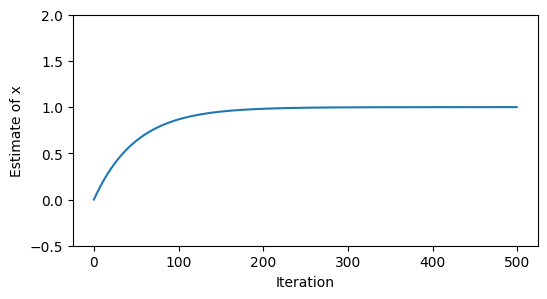

In [23]:
# Initial estimate
x = torch.tensor(0., requires_grad=True)
# Initialize optimizer with parameters to be optimized and learning rate "lambda"
optim = torch.optim.SGD([x], lr=0.01)
# Number of iterations
n_iter = 500

#create list to track value of x
xs = []

# Gradient descent loop
for i in range(n_iter):

    # Logging
    xs.append(x.item())

    f = x**2 - 4*x + 2*x - 1 # forward pass
    f.backward() # backward pass

    optim.step() # perform the gradient descent step
    optim.zero_grad() # reset the gradients

# Plot how the estimate for x converged
plot_graph('Iteration', 'Estimate of x', [-0.5, 2.0], xs)

We clearly see that through differentation and and automatic update, we approximate the value of x that gives us the minimum of our function $f(x)$.
Now lets take all these components and combine them to create a differentiable linear gain model that can predict the gain value for a specific input output pair.

### A simple <ins>*Differentiable*</ins> **Linear Gain** Effect

We will now take a pair of dry and processed audio processed by a gain factor, and we will use gradient descent to estimate the parameters that were applied to the dry signal to obtain the processed one. We can inherit use the Module and Parameter classes from PyTorch to define the behavior and parameters of our gain control.

We start by creating our train and target signals

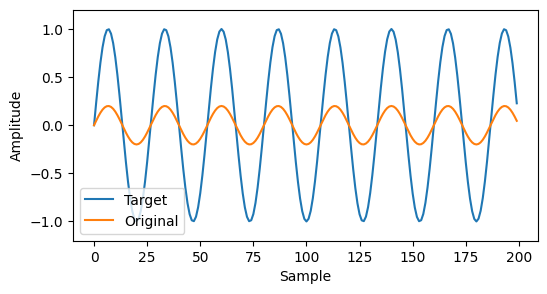

In [24]:
#Create input and target
sr = 16000
freq = 300
target_gain = 0.2

# generate half a second of sine wave at 300 Hz
input_audio = get_sine(1.0, freq, sr)
target_audio = get_sine(target_gain, freq, sr)

plot_graph('Sample', 'Amplitude', [-1.2, 1.2], input_audio[:200], target_audio[:200], ["Target", "Original"])

ipd.display(ipd.Audio(input_audio, rate=sr, normalize=False))
ipd.display(ipd.Audio(target_audio, rate=sr, normalize=False))

We define our model using nn.Module (see that it inherits a forward function), and train.

In [25]:
#create linear gain function
class LinearGain(torch.nn.Module):
    def __init__(self, gain=1.0):
        super().__init__()
        self.gain = torch.nn.Parameter(torch.tensor(gain))

    def forward(self, x):
        return self.gain * x

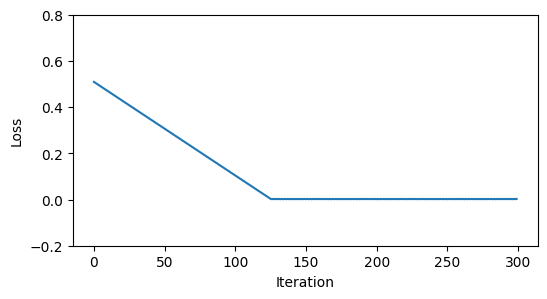

In [26]:
diff_gain = LinearGain() # initialise module
l1_loss = torch.nn.L1Loss() # measures the mean absolute error (MAE) between each element in the input x and target
optim = torch.optim.SGD(diff_gain.parameters(), lr=0.01) #initialise optimizer

n_iter = 300

gains = []
losses = []

for i in range(n_iter):
    #logging
    gains.append(diff_gain.gain.item())

    optim.zero_grad()

    estim_audio = diff_gain(input_audio) # forward pass

    loss = l1_loss(estim_audio, target_audio)
    losses.append(loss.item())

    loss.backward() #calculate gradients based on loss

    optim.step() #update the parameter

# Plot how the estimate for x converged
plot_graph('Iteration', 'Loss', [-0.2, 0.8], losses)

Lets look at the how the processed signal changes for each iteration comapare to the target.

In [27]:
# Animate the fitting process
def get_gain_loss_animation(org, tgt, gains, losses):
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

    # Plot target and estimate
    ax[0].plot(tgt[:200])
    line, = ax[0].plot([], [])
    ax[0].set_xlabel("Time (samples)")
    ax[0].set_ylabel("Amplitude")
    ax[0].set_ylim(-1, 1)
    ax[0].legend(["Target", "Estimate"], loc=1)

    # Plot losses animation
    ax[1].set_xlim(0, len(losses))
    ax[1].set_ylim(min(losses), max(losses))
    line_loss, = ax[1].plot([], [], lw=2)
    ax[1].set_xlabel("Iteration")
    ax[1].set_ylabel("Loss")

    def init():
        line.set_data([], [])
        line_loss.set_data([], [])
        return line, line_loss,

    def animate(i):
        # Update estimate plot
        line.set_data(np.arange(200), org[:200] * gains[i * 5])
        ax[0].set_title(f"Estimated signal after {i * 5} iterations")
        ax[1].set_title(f"Loss after {i * 5} iterations")

        # Update losses plot
        line_loss.set_data(np.arange((i*5)+1), losses[:(i*5)+1])
        return line, line_loss,

    # Create the animation
    anim = FuncAnimation(fig, animate, init_func=init, frames=len(gains) // 5, interval=50, blit=True)
    plt.close(fig)
    return anim

display(HTML(get_gain_loss_animation(input_audio, target_audio, gains, losses).to_html5_video()))

We see that we over time learn the gain value that results in the target. We also see that the loss, being the mean squared amplitude difference between the processed input and the target, decreases and reaches 0 at the same iteration that the sines perfectly align in amplitude.

However, the problem we are trying to solve is very easy as it is: linear, contains input and target that is aligned time-wise and only includes one parameter.

Rather, lets look at something a bit more complex.

### A simple <ins>*Differentiable*</ins> **Waveshaper**

A waveshaper is used to shape a sound giving it more harmonics. This is often results in a warm or harsh feeling also known from saturation or overdrive effects (espesically prominent in guitar pedals). If we want to model the characteristics of analog distortion, and especially tube distortion, we can use a modified tanh() function as this allows us to model the positive and negative slopes of the input differently. The modified tanh function is given by:

$tanh_{mod}(x) = \frac{e^{x*(a+G)} - e^{x*(b+G)}}{e^{x*G} + e^{x*-G}}$

Here the distortion amount $G$ defines the overall shape/drive, whereas $a$ and $b$ small offsets added to the positive and negative parts of the input signal respectively.

Lets create a training and target signal using the modified tanh function.

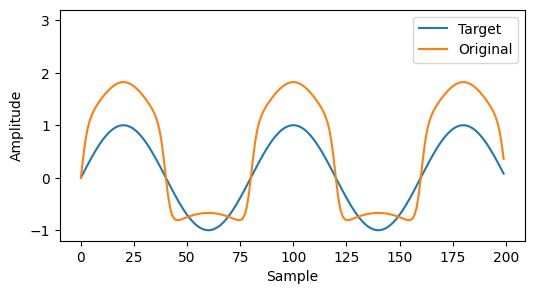

In [28]:
def mod_tanh(x, a, b, g):
    numerator = np.exp(x*(a+g)) - np.exp(x*(b-g))
    denominator = np.exp(x*g) + np.exp(x*(-g))
    return numerator/denominator

#Create input and target
sr = 48000
freq = 300
target_a = 0.6
target_b = 0.4
target_g = 4.5

# generate half a second of sine wave at 300 Hz
input_audio = get_sine(1.0, freq, sr)
target_audio = mod_tanh(input_audio, target_a, target_b, target_g)

plot_graph('Sample', 'Amplitude', [-1.2, 3.2], input_audio[:200], target_audio[:200], ["Target", "Original"])

ipd.display(ipd.Audio(input_audio, rate=sr, normalize=True))
ipd.display(ipd.Audio(target_audio, rate=sr, normalize=True))

guitar, _ = librosa.load('sound-files/guitar.wav', sr=sr, mono=True)
guitar_dist = mod_tanh(guitar, target_a, target_b, target_g)
ipd.display(ipd.Audio(guitar, rate=sr, normalize=True))
ipd.display(ipd.Audio(guitar_dist, rate=sr, normalize=True))

We implement it in the PyTorch framework for automatic differentiation

In [29]:
class Modified_Tanh(torch.nn.Module):
    def __init__(self, a=0.0, b=0.0, g=0.0):
        super().__init__()
        self.a = torch.nn.Parameter(torch.tensor(a))
        self.b = torch.nn.Parameter(torch.tensor(b))
        self.g = torch.nn.Parameter(torch.tensor(g))

    def forward(self, x):
        numerator = torch.exp(x*(self.a+self.g)) - torch.exp(x*(self.b-self.g))
        denominator = torch.exp(x*self.g) + torch.exp(x*(-self.g))
        return numerator/denominator

Again, we train using the SGD optimizer

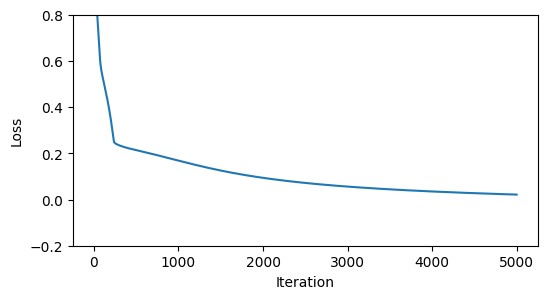

In [30]:
diff_effect = Modified_Tanh() # initialise module
l1_loss = torch.nn.L1Loss() # measures the mean absolute error (MAE) between each element in the input x and target
optim = torch.optim.SGD(diff_effect.parameters(), lr=0.01) #initialise optimizer

n_iter = 5000

a = []
b = []
g = []
losses = []

for i in range(n_iter):
    #logging
    a.append(diff_effect.a.item())
    b.append(diff_effect.b.item())
    g.append(diff_effect.g.item())

    optim.zero_grad()

    estim_audio = diff_effect(input_audio) # forward pass

    loss = l1_loss(estim_audio, target_audio)
    losses.append(loss.item())

    loss.backward() #calculate gradients based on loss

    optim.step() #update the parameter

# Plot how the estimate for x converged
plot_graph('Iteration', 'Loss', [-0.2, 0.8], losses)

We can now track the parameters/coefficients to see how they change over time when we update them through gradient descent

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Animate the fitting process
def get_loss_animation(losses_list):
    num_iterations = len(losses_list[0])
    num_plots = len(losses_list)

    fig, ax = plt.subplots(figsize=(10, 4))

    lines_loss = []
    annotations = []
    for i in range(num_plots):
        if i == 0:
            label = "a"
        elif i == 1:
            label = "b"
        else:
            label = "g"

        line_loss, = ax.plot([], [], lw=2, label=label)
        lines_loss.append(line_loss)
        annotations.append(ax.text(0.95, 0.9-i*0.1, '', transform=ax.transAxes, ha='right', va='center'))

    ax.set_xlim(0, num_iterations)
    ax.set_ylim(0, max([max(losses) for losses in losses_list]))
    ax.set_xlabel("Iteration")
    ax.set_ylabel("Param Val")
    ax.legend(loc='upper left')

    def init():
        for line, annotation in zip(lines_loss, annotations):
            line.set_data([], [])
            annotation.set_text('')
        return lines_loss + annotations

    def animate(iter_idx):
        for i, (line_loss, annotation) in enumerate(zip(lines_loss, annotations)):
            if i == 0:
                label = "a"
                target = target_a
            elif i == 1:
                label = "b"
                target = target_b
            else:
                label = "g"
                target = target_g

            line_loss.set_data(np.arange((iter_idx*30)+1), losses_list[i][:(iter_idx*30)+1])
            annotation.set_text(f"{label}: {losses_list[i][iter_idx*30]:.2f} - target: {target}")
            annotation.set_position((0.95, 0.9-i*0.1))
            ax.set_title(f"Parameters after {iter_idx * 30} iterations")
        return lines_loss + annotations

    # Create the animation
    anim = FuncAnimation(fig, animate, init_func=init, frames=num_iterations // 30, interval=50, blit=True)
    plt.close(fig)
    return anim

coeffs = [a, b, g]

# Example usage:
display(HTML(get_loss_animation(coeffs).to_html5_video()))

We are pretty close! Lets try to hear it on a guitar

In [32]:
diff_effect.eval()

input_to_process = torch.tensor(guitar)

with torch.no_grad():
    processed = diff_effect(input_to_process)

processed = processed.reshape(-1).cpu().numpy()
print("Original")
ipd.display(ipd.Audio(guitar, rate=sr, normalize=True))
print("Target")
ipd.display(ipd.Audio(guitar_dist, rate=sr, normalize=True))
print("Predicted")
ipd.display(ipd.Audio(processed, rate=sr, normalize=True))

Original


Target


Predicted


### A simple <ins>*Differentiable*</ins> **IIR Filter** Effect

A system with infinite impulse response (IIR) is called an IIR filter. Here each processed output sample is dependent on both former samples of the input and former samples of the output, each scaled by a coefficient. It is also called a recursive system because the output samples are recursively computed from past output samples.

The z-domain transfer function of a general second order IIR filter having 2 poles and 2 zeros (poles and zeros are the roots of the numerator and denominator of the transfer function, respectively), is given by:

$H(z) = \frac{b_0 + b_1z^{-1} + b_2z^{-2}}{1 + a_1z^{-1} + a_2z^{-2}}$

Since this transfer function is the ratio of two quadratic functions, it is commonly referred to as a biquad filter, which is used for many musical purposes.

As before, we can train (automatically update and predict) the coefficients of this filter function to estimate a specific frequency response. We use the *Transposed Direct Form-II (TDF-II)* to retrieve the difference equation from above transfer function.

- $y[n] = b_0x[n] + h_1[n-1]$
- $h_1[n] = b_1x[n] - a_1y[n] + h_2[n-1]$
- $h_2[n] = b_2x[n] - a_2y[n]$

We again implement this difference equation into by PyTorch by inhereting from the nn.Module.

Notice how we store the vectors h1 and h2 in a matrix for simplification purposes.

In [33]:
class DTDFII(Module):
    def __init__(self):
        super(DTDFII, self).__init__()
        self.b0 = Parameter(FloatTensor([uniform(-1, 1)]))
        self.b1 = Parameter(FloatTensor([uniform(-1, 1)]))
        self.b2 = Parameter(FloatTensor([uniform(-1, 1)]))
        self.a1 = Parameter(FloatTensor([uniform(-0.5, 0.5)]))
        self.a2 = Parameter(FloatTensor([uniform(-0.5, 0.5)]))

    def _cat(self, vectors):
        return torch.cat([v_.unsqueeze(-1) for v_ in vectors], dim=-1)

    def forward(self, input, h):
        output = input * self.b0 + h[:, 0]

        h1 = input * self.b1 + h[:, 1] - output * self.a1
        h2 = input * self.b2 - output * self.a2

        h = self._cat([h1, h2])

        return output, h

    def init_states(self, size):
        h = torch.zeros(size, 2).to(next(self.parameters()).device)
        return h

We define our input as a chirp (sine sweep) going from 0 to 20kHz in 2 seconds, with the target being the same sweep filtered by a DSP butterworth algorithm at 2kHz. By iteratively comparing the processed input to the actual filtered output, we try to adjust our differentiable IIR filter to match the frequency response of the original filter.

The filter has the following coefficients:
Coeffs b: [ 0.41816335 -0.83632669  0.41816335] , coeffs a: [ 1.         -0.46293803  0.20971536]


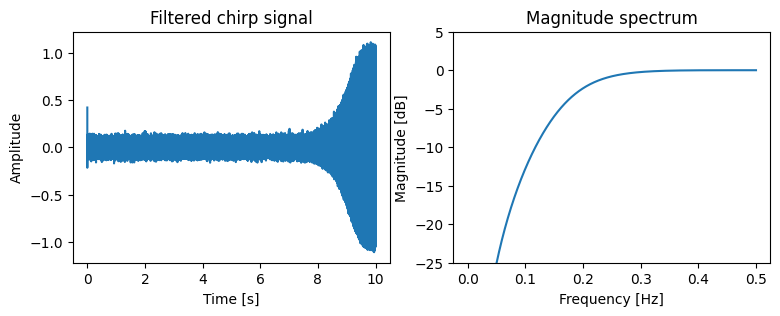

In [34]:
from scipy import signal
import numpy as np

fs = 48000
sec = 10
T = int(fs * sec)
start_freq = 1
end_freq = 20000
t = np.linspace(0, sec, sec*fs)

train_input = signal.chirp(t=t, f0=start_freq, t1=sec, f1=end_freq, method='logarithmic') + np.random.normal(scale=5e-2, size=len(t))

fc = 18000 #Hz
b, a = signal.butter(N=2, Wn=fc/fs, btype='high')
print("The filter has the following coefficients:")
print("Coeffs b:", b, ", coeffs a:", a)
sos = signal.tf2sos(b, a)

train_target = signal.sosfilt(sos, train_input)
impulse = np.zeros(1000)
impulse[0] = 1.0
imp_filter = signal.sosfilt(sos, impulse)

plot_tf("Filtered chirp signal", fs, np.arange(T) / fs, [train_target], [imp_filter])

ipd.display(ipd.Audio(train_input, rate=fs, normalize=True))
ipd.display(ipd.Audio(train_target, rate=fs, normalize=True))

Above training signal is 2 seconds long at 48kHz, that is 96000 samples (that is long!). Performing our forward step on 96000 samples is computationally inefficient, meaning that we have to wait long for each gradient calculation and thus parameter update. In order to to make the operations more efficient, we split our signals into batches of sequences, such that we now apply the filter operations on a matrix consisting of (batch_size, sequence_length, audio_channels).

How this is done is not important, we use a utility function you can check out in the utils.py script.

In [35]:
batch_size = 1024
sequence_length = 512

loader = DataLoader(dataset=DIIRDataSet(train_input, train_target, sequence_length), batch_size=batch_size, shuffle=True, drop_last=False)
print("Batch dim:", next(iter(loader))['input'].size())
print("Sequences available in dataset:", int(len(train_input)/sequence_length))
print("Batches available in dataset:", int(np.ceil(int(len(train_input)/sequence_length) / batch_size)))


Batch dim: torch.Size([937, 512, 1])
Sequences available in dataset: 937
Batches available in dataset: 1


Above we see that from a training signal of 96000, we have 187 sequences of 512 samples. With a batch_size of 128, this means we have two batches: one consisting of 128 sequences, 1 consisting of 59 sequences.

We define our model, loss function and optimizer (this time we use Adam rather than SGD).

In [36]:
from torch.optim import Adam
device = 'cuda:1'

n_epochs = 4000

filter_function = DTDFII()
model = DIIR_WRAPPER(filter_function).to(device)
optimizer = Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)
criterion = torch.nn.MSELoss()

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

### Define training loop

We define a training loop. Here we loop through each batch, calculate the loss and return it for visualisation purposes.

In [ ]:
def train(criterion, model, loader, optimizer):
    model.train()
    device = next(model.parameters()).device
    total_loss = 0
    for batch in loader:
        input_seq_batch = batch['input'].to(device)
        target_seq_batch = batch['target'].to(device)

        optimizer.zero_grad()

        predicted_output = model(input_seq_batch)
        loss = criterion(target_seq_batch, predicted_output)
        loss.backward()

        optimizer.step()
        total_loss += loss.item()

    total_loss /= len(loader)
    return total_loss

### Train!
#### DO NOT RUN THIS CELL - ON A CPU TRAINING MAY TAKE SEVERAL HOURS (TOOK 45 min ON A GPU)

In [ ]:
#losses = []
#b0, b1, b2 = [], [], []
#a1, a2 = [], []

for epoch in range(n_epochs):
    loss = train(criterion, model, loader, optimizer)
    losses.append(loss)

    b0.append(model.cell.b0.item())
    b1.append(model.cell.b1.item())
    b2.append(model.cell.b2.item())
    a1.append(model.cell.a1.item())
    a2.append(model.cell.a2.item())

    #if epoch % 100 == 0:
    #    print("Epoch {} -- Loss {:3E}".format(epoch, loss))

In [ ]:
coeffs = [b0, b1, b2, a1, a2]

In [ ]:
plt.figure(figsize=(6, 3))
plt.plot(losses)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.yscale('log')
plt.show()

Let's look at how each coefficient adjusts across each iteration.

We clearly see that they are finding their way towards a configuration that gives the minimum of our objective function - this is the magic of DDSP.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Animate the fitting process
def get_loss_animation(losses_list):
    num_iterations = len(losses_list[0])
    num_plots = len(losses_list)

    fig, ax = plt.subplots(figsize=(6, 3))

    lines_loss = []
    for i in range(num_plots):
        if i < 3:
            label=f"b{i+1}"
        else:
            label=f"a{i-3}"
        line_loss, = ax.plot([], [], lw=2, label=label)
        lines_loss.append(line_loss)

    ax.set_xlim(0, num_iterations)
    ax.set_ylim(-1, max([max(losses) for losses in losses_list]))
    ax.set_xlabel("Iteration")
    ax.set_ylabel("Loss")
    ax.legend()

    def init():
        for line in lines_loss:
            line.set_data([], [])
        return lines_loss

    def animate(iter_idx):
        for i, line_loss in enumerate(lines_loss):
            line_loss.set_data(np.arange((iter_idx*30)+1), losses_list[i][:(iter_idx*30)+1])
            ax.set_title(f"Losses after {iter_idx*30} iterations")
        return lines_loss

    # Create the animation
    anim = FuncAnimation(fig, animate, init_func=init, frames=num_iterations // 30, interval=50, blit=True)
    plt.close(fig)
    return anim

# Example usage:
display(HTML(get_loss_animation(coeffs).to_html5_video()))


Let's also see if we have approached the target frequency response

In [ ]:
model.eval()

impulse = np.zeros(sequence_length)
impulse[0] = 1.0
impulse = torch.tensor(impulse, dtype=torch.float32).to(device)

input_to_process = train_input
padding = int(np.ceil((len(input_to_process) / sequence_length)) * sequence_length) - len(input_to_process)
batched_input = torch.nn.functional.pad(torch.tensor(input_to_process, dtype=torch.float32), (0, padding)).reshape(-1, sequence_length, 1)
processed = torch.zeros(batched_input.shape)

with torch.no_grad():
    processed = model(batched_input.to(device))
    imp_model = model(impulse.unsqueeze(0).unsqueeze(-1))

processed = processed.reshape(-1).cpu().numpy()
imp_model = imp_model.reshape(-1).cpu().numpy()


plot_tf(
    "Filtered Chirp signal",
    fs,
    np.arange(len(train_target)) / fs,
    [train_target, processed[:len(train_target)]],
    [imp_filter, imp_model],
    ["scipy.signal.butter", "diff_iir"]
)

We see that we are approaching the target frequency reponse